In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pwd

/content


In [28]:
%cd /content/drive/MyDrive/insurance_problems/

/content/drive/MyDrive/insurance_problems


In [5]:
!pwd

/content/drive/MyDrive/term_plan


In [29]:


# from roboflow import Roboflow
# rf = Roboflow(api_key="0bJgEGuNMCBI0LuOlu9a")
# project = rf.workspace("object-detection-ob1qs").project("poc-insurance-plans")
# version = project.version(2)
# dataset = version.download("yolov5")


!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="0bJgEGuNMCBI0LuOlu9a")
project = rf.workspace("object-detection-ob1qs").project("poc-insurance-plans")
version = project.version(3)
dataset = version.download("yolov5")



loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to POC---Insurance-Plans-3 in yolov5pytorch:: 100%|██████████| 867/867 [00:07<00:00, 118.26it/s]


In [30]:
%cd /content/drive/MyDrive/insurance_problems

/content/drive/MyDrive/insurance_problems


In [9]:
# # clone YOLOv5 repository
# !git clone https://github.com/ultralytics/yolov5.git  # clone repo
# %cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16748, done.
remote: Counting objects: 100% (69/69), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 16748 (delta 26), reused 46 (delta 15), pack-reused 16679
Receiving objects: 100% (16748/16748), 15.36 MiB | 15.42 MiB/s, done.
Resolving deltas: 100% (11505/11505), done.
/content/drive/MyDrive/insurance_problems/yolov5


In [35]:
%cd yolov5

/content/drive/MyDrive/insurance_problems/yolov5


In [31]:

import torch

from IPython.display import Image, clear_output  # to display images
# from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.3.0+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)


# Your Custom Data

In [32]:
data_yaml_file = '/content/drive/MyDrive/insurance_problems/data/data.yaml'
yolos_yaml_file = '/content/drive/MyDrive/insurance_problems/yolov5/models/yolov5s.yaml'
# custom_yolos_yaml_file = '/content/drive/MyDrive/term_plan/yolov5/models/custom_yolov5s.yaml'

# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [11]:
!pwd

/content/drive/MyDrive/insurance_problems/yolov5


In [ ]:
# define number of classes based on YAML
import yaml
with open(data_yaml_file, 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
num_classes

'5'

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
data_yaml_file

'/content/dataset_yolov5/data.yaml'

In [ ]:

%cd /content/


/content


In [12]:
!pwd

/content/drive/MyDrive/insurance_problems/yolov5


In [ ]:
data_yaml_file = '/content/drive/MyDrive/term_plan/data/data.yaml'
yolos_yaml_file = '/content/drive/MyDrive/term_plan/yolov5/models/yolov5s.yaml'
# custom_yolos_yaml_file = '/content/drive/MyDrive/term_plan/yolov5/models/custom_yolov5s.yaml'

In [36]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time

!python train.py --img 416 --batch 32 --epochs 300 --data /content/drive/MyDrive/insurance_problems/data/data.yaml  --cfg /content/drive/MyDrive/insurance_problems/yolov5/models/yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_results  --cache


2024-07-09 10:54:57.666378: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-09 10:54:57.666446: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-09 10:54:57.668636: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=/content/drive/MyDrive/insurance_problems/yolov5/models/yolov5s.yaml, data=/content/drive/MyDrive/insurance_problems/data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyp

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [37]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

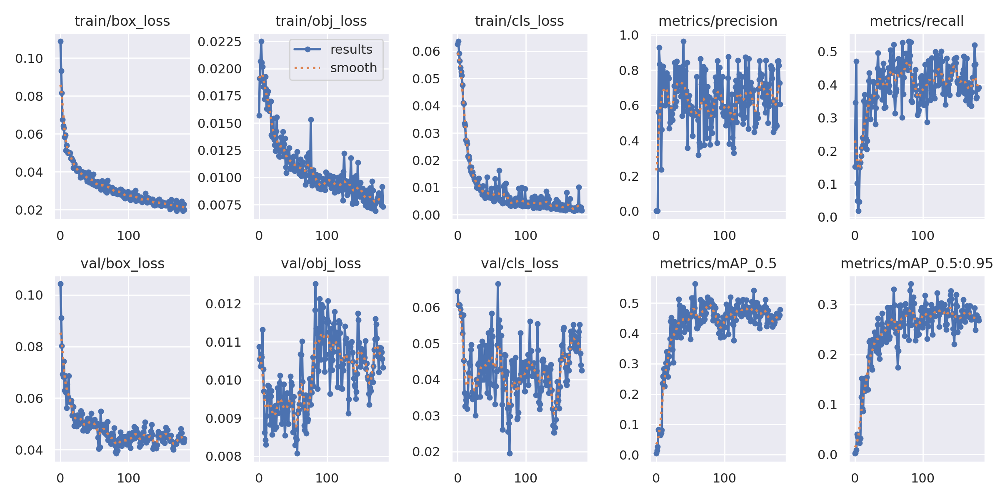

In [38]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/drive/MyDrive/insurance_problems/yolov5/runs/train/yolov5s_results3/results.png', width=1000)  # view results.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


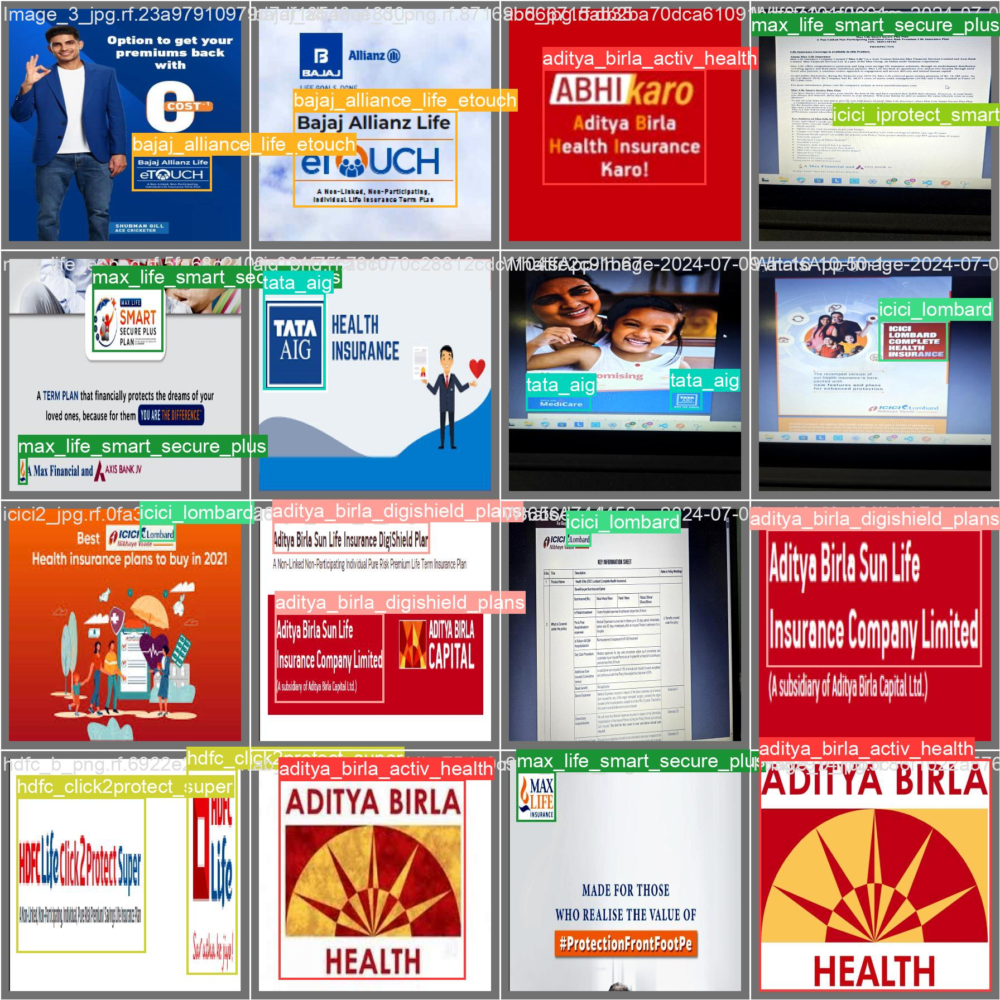

In [39]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/drive/MyDrive/insurance_problems/yolov5/runs/train/yolov5s_results3/val_batch0_labels.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [41]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
!python detect.py --weights /content/drive/MyDrive/insurance_problems/yolov5/runs/train/yolov5s_results3/weights/best.pt --img 416 --conf 0.2 --source /content/drive/MyDrive/insurance_problems/data/test/images
# %cd /content/yolov5/


detect: weights=['/content/drive/MyDrive/insurance_problems/yolov5/runs/train/yolov5s_results3/weights/best.pt'], source=/content/drive/MyDrive/insurance_problems/data/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-338-gff063284 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/18 /content/drive/MyDrive/insurance_problems/data/test/images/Image_1_png.rf.2a5c7b6752f674d0f06161a3703ed812.jpg: 416x416 1 icici_lombard, 8.2ms
image 2/18 /content/drive/MyDri

In [27]:

!python detect.py --weights /content/drive/MyDrive/insurance_problems/yolov5/runs/train/yolov5s_results3/weights/best.pt --img 416 --conf 0.2 --source /content/drive/MyDrive/insurance_problems/real_data/
# %cd /content/yolov5/

detect: weights=['/content/drive/MyDrive/insurance_problems/yolov5/runs/train/yolov5s_results2/weights/best.pt'], source=/content/drive/MyDrive/insurance_problems/real_data/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-338-gff063284 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/insurance_problems/real_data/WhatsApp Image 2024-07-09 at 15.49.52.jpeg: 416x256 (no detections), 85.5ms
Speed: 0.5ms pre-process, 85.5ms inference, 63.6ms NMS per image at shape (1, 3, 416, 416)
Resu